In [1]:
import torch  
import torch.nn as nn
import numpy as np
import PIL.Image as Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch import optim
from torch.autograd import Variable
import torch.nn.functional as F

from skimage.io import imsave

In [2]:
def unwrap(x):
    y = x % (2 * np.pi)
    return torch.where(y > np.pi, 2*np.pi - y, y)

def fft2dc(x):
    return np.fft.fftshift(np.fft.fft2(x))
  
def ifft2dc(x):
    return np.fft.ifft2(np.fft.fftshift(x))

def Phase_unwrapping(in_, s=500):
    f = np.zeros((s,s))
    for ii in range(s):
        for jj in range(s):
            x = ii - s/2
            y = jj - s/2
            f[ii,jj] = x**2 + y**2
    a = ifft2dc(fft2dc(np.cos(in_)*ifft2dc(fft2dc(np.sin(in_))*f))/(f+0.000001))
    b = ifft2dc(fft2dc(np.sin(in_)*ifft2dc(fft2dc(np.cos(in_))*f))/(f+0.000001))
    out = np.real(a - b)
    return out

In [3]:
def propagator(Nx,Ny,z,wavelength,deltaX,deltaY):
    k = 1/wavelength
    x = np.expand_dims(np.arange(np.ceil(-Nx/2),np.ceil(Nx/2),1)*(1/(Nx*deltaX)),axis=0)
    y = np.expand_dims(np.arange(np.ceil(-Ny/2),np.ceil(Ny/2),1)*(1/(Ny*deltaY)),axis=1)
    y_new = np.repeat(y,Nx,axis=1)
    x_new = np.repeat(x,Ny,axis=0)
    kp = np.sqrt(y_new**2+x_new**2)
    term=k**2-kp**2
    term=np.maximum(term,0) 
    phase = np.exp(1j*2*np.pi*z*np.sqrt(term))
    return phase

# um
Nx = 500
Ny = 500
z = 12000
wavelength = 0.532
deltaX = 4
deltaY = 4

Load image

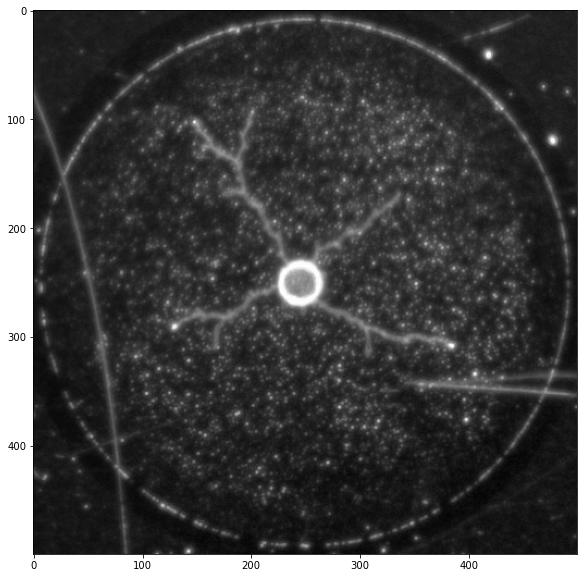

In [7]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

img = rgb2gray(np.array(Image.open('./b1.png')))
#img = np.sqrt(img)
img = (img-np.min(img))/(np.max(img)-np.min(img))

plt.figure(figsize=(20,10))
plt.imshow(np.squeeze(img), cmap='gray')

Field mesurement/generate hologram

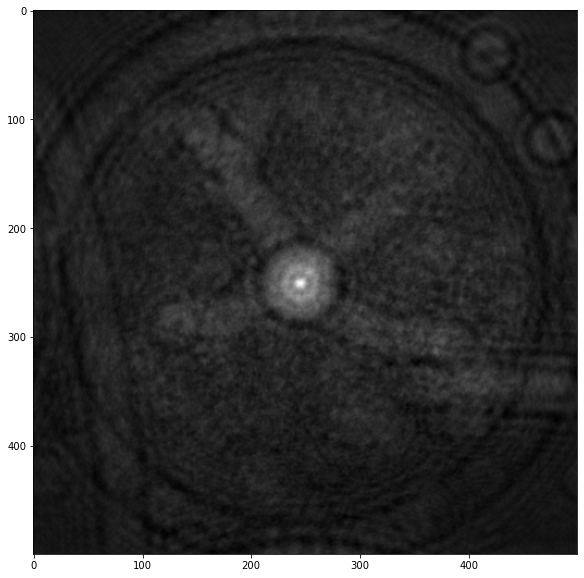

In [8]:
phase = propagator(Nx,Ny,z,wavelength,deltaX,deltaY)
E = np.ones((Nx,Ny))  # illumination light
E = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(np.conj(phase)))

Es = img*E
S = np.fft.ifft2(np.fft.fft2(Es)*np.fft.fftshift(phase))

S1 = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(phase))

s=(S+1)*np.conj(S+1);
s1=(S1+1)*np.conj(S1+1);
g = s/s1

hologram = np.abs(g)

plt.figure(figsize=(20,10))
plt.imshow(hologram, cmap='gray')

Back-propagate

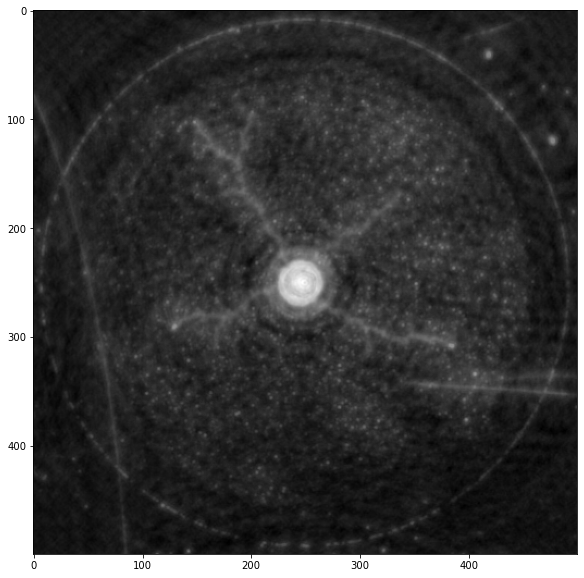

In [9]:
bp = np.fft.ifft2(np.fft.fft2(hologram)*np.fft.fftshift(np.conj(phase)))
plt.figure(figsize=(20,10))
plt.imshow(np.abs(bp), cmap='gray')

Reconstruction Loss

In [10]:
class RECLoss(nn.Module):
    def __init__(self):
        super(RECLoss,self).__init__()
        self.Nx = 500
        self.Ny = 500
        self.z = 12000
        self.wavelength = 0.532
        self.deltaX = 4
        self.deltaY = 4
        self.prop = self.propagator(self.Nx,self.Ny,self.z,self.wavelength,self.deltaX,self.deltaY)
        self.prop = self.prop.cuda()

    def propagator(self,Nx,Ny,z,wavelength,deltaX,deltaY):
        k = 1/wavelength
        x = np.expand_dims(np.arange(np.ceil(-Nx/2),np.ceil(Nx/2),1)*(1/(Nx*deltaX)),axis=0)
        y = np.expand_dims(np.arange(np.ceil(-Ny/2),np.ceil(Ny/2),1)*(1/(Ny*deltaY)),axis=1)
        y_new = np.repeat(y,Nx,axis=1)
        x_new = np.repeat(x,Ny,axis=0)
        kp = np.sqrt(y_new**2+x_new**2)
        term=k**2-kp**2
        term=np.maximum(term,0) 
        phase = np.exp(1j*2*np.pi*z*np.sqrt(term))
        return torch.from_numpy(np.concatenate([np.real(phase)[np.newaxis,:,:,np.newaxis], np.imag(phase)[np.newaxis,:,:,np.newaxis]], axis = 3))
   

    def roll_n(self, X, axis, n):
        f_idx = tuple(slice(None, None, None) if i != axis else slice(0, n, None) for i in range(X.dim()))
        b_idx = tuple(slice(None, None, None) if i != axis else slice(n, None, None) for i in range(X.dim()))
        front = X[f_idx]
        back = X[b_idx]
        return torch.cat([back, front], axis)

    def batch_fftshift2d(self, x):
        real, imag = torch.unbind(x, -1)
        for dim in range(1, len(real.size())):
            n_shift = real.size(dim)//2
            if real.size(dim) % 2 != 0:
                n_shift += 1  # for odd-sized images
            real = self.roll_n(real, axis=dim, n=n_shift)
            imag = self.roll_n(imag, axis=dim, n=n_shift)
        return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

    def batch_ifftshift2d(self,x):
        real, imag = torch.unbind(x, -1)
        for dim in range(len(real.size()) - 1, 0, -1):
            real = self.roll_n(real, axis=dim, n=real.size(dim)//2)
            imag = self.roll_n(imag, axis=dim, n=imag.size(dim)//2)
        return torch.stack((real, imag), -1)  # last dim=2 (real&imag)
    
    def complex_mult(self, x, y):
        real_part = x[:,:,:,0]*y[:,:,:,0]-x[:,:,:,1]*y[:,:,:,1]
        real_part = real_part.unsqueeze(3)
        imag_part = x[:,:,:,0]*y[:,:,:,1]+x[:,:,:,1]*y[:,:,:,0]
        imag_part = imag_part.unsqueeze(3)
        return torch.cat((real_part, imag_part), 3)
    
    def TV(self,x):
        batch_size = x.size()[0]
        h_x = x.size()[2]
        w_x = x.size()[3]
        count_h = self._tensor_size(x[:,1:,:,:])
        count_w = self._tensor_size(x[:,:,1:,:])
        h_tv = torch.pow((x[:,1:,:,:]-x[:,:h_x-1,:,:]),2).sum() #gradient in horizontal axis
        w_tv = torch.pow((x[:,:,1:,:]-x[:,:,:w_x-1,:]),2).sum() #gradient in vertical axis
        return 0.01*2*(h_tv/count_h+w_tv/count_w)/batch_size
    
    def forward(self,x,y):
        x = x.squeeze(2)
        y = y.squeeze(2)
        x = x.permute([0,2,3,1])
        y = y.permute([0,2,3,1])
        
        
        cEs = self.batch_fftshift2d(torch.fft(x,3,normalized=True))
        cEsp = self.complex_mult(cEs,self.prop)
        
        S = torch.ifft(self.batch_ifftshift2d(cEsp),3,normalized=True)
        Se = S[:,:,:,0]
        
        loss = torch.mean(torch.abs(Se-torch.sqrt(y[:,:,:,0])))/2#torch.mean(torch.abs(Se-y[:,:,:,0]))/2#
        return loss


    def _tensor_size(self,t):
        return t.size()[1]*t.size()[2]*t.size()[3]

In [11]:
def dwt_init(x):

    x01 = x[:, :, 0::2, :] / 2
    x02 = x[:, :, 1::2, :] / 2
    x1 = x01[:, :, :, 0::2]
    x2 = x02[:, :, :, 0::2]
    x3 = x01[:, :, :, 1::2]
    x4 = x02[:, :, :, 1::2]
    x_LL = x1 + x2 + x3 + x4
    x_HL = -x1 - x2 + x3 + x4
    x_LH = -x1 + x2 - x3 + x4
    x_HH = x1 - x2 - x3 + x4

    return torch.cat((x_LL, x_HL, x_LH, x_HH), 1)

def iwt_init(x):
    r = 2
    in_batch, in_channel, in_height, in_width = x.size()
    #print([in_batch, in_channel, in_height, in_width])
    out_batch, out_channel, out_height, out_width = in_batch, int(
        in_channel / (r ** 2)), r * in_height, r * in_width
    x1 = x[:, 0:out_channel, :, :] / 2
    x2 = x[:, out_channel:out_channel * 2, :, :] / 2
    x3 = x[:, out_channel * 2:out_channel * 3, :, :] / 2
    x4 = x[:, out_channel * 3:out_channel * 4, :, :] / 2
    

    h = torch.zeros([out_batch, out_channel, out_height, out_width]).float().cuda()

    h[:, :, 0::2, 0::2] = x1 - x2 - x3 + x4
    h[:, :, 1::2, 0::2] = x1 - x2 + x3 - x4
    h[:, :, 0::2, 1::2] = x1 + x2 - x3 - x4
    h[:, :, 1::2, 1::2] = x1 + x2 + x3 + x4

    return h

In [12]:
# finish the model
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        
        self.conv_init = nn.Sequential( 
            nn.Conv2d(2, 32, 5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.Conv2d(32, 32, 3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.MaxPool2d(2)
        )
        
        self.conv_1 = nn.Sequential(   
            nn.Conv2d(32, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.Conv2d(64, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.MaxPool2d(2)
        )
        
        self.conv_2 = nn.Sequential(   
            nn.Conv2d(64, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.MaxPool2d(2)
        )
        
        self.conv_nonlinear = nn.Sequential(   
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.Conv2d(128, 16, 3, stride=1, padding=1),
            nn.Tanh(),
        )
        
        
        self.deconv_1 = nn.Sequential(
            nn.Conv2d(16, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            #nn.Upsample(scale_factor=2, mode='bilinear')
            nn.ConvTranspose2d(128, 128, 2, stride=2, padding=0, output_padding=0)
        )
        
        self.deconv_2 = nn.Sequential(
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.Conv2d(64, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            #nn.Upsample(scale_factor=2, mode='bilinear')
            nn.ConvTranspose2d(64, 64, 2, stride=2, padding=0, output_padding=0)
        )
        
        self.deconv_3 = nn.Sequential(
            nn.Conv2d(64, 32, 3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.Conv2d(32, 32, 3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            #nn.Upsample(scale_factor=2, mode='bilinear')
            nn.ConvTranspose2d(32, 32, 2, stride=2, padding=0, output_padding=0)
        )
        
        self.deconv_4 = nn.Sequential(
            nn.Conv2d(32, 32, 3, stride=1, padding=2),
            nn.ReLU(True),
            nn.Conv2d(32, 32, 3, stride=1, padding=2),
            nn.ReLU(True),
            nn.Conv2d(32, 2, 3, stride=1, padding=1),
        )
        
    
    def forward(self,x):
        x = self.conv_init(x)
        x = self.conv_1(x)
        x = self.conv_2(x)
        x = self.conv_nonlinear(x)
        
        x = self.deconv_1(x)
        x = self.deconv_2(x)
        x = self.deconv_3(x)
        x = self.deconv_4(x)
        return x

In [13]:
device = torch.device("cuda")

from torchsummary import summary
criterion = RECLoss()
model = Net().to(device)
optimizer = optim.Adam(model.parameters(), lr=5e-3)
#summary(model, input_size=(2,500,500))

In [14]:
epoch = 2500
period = 100
eta = torch.Tensor(np.concatenate([np.abs(bp)[np.newaxis,:,:], np.zeros_like(np.abs(bp))[np.newaxis,:,:]], axis = 0))
holo = torch.Tensor(np.concatenate([np.real(hologram)[np.newaxis,:,:], np.imag(hologram)[np.newaxis,:,:]], axis = 0))
holo = holo
eta = eta.to(device).unsqueeze(0)
holo = holo.to(device).unsqueeze(0)

<ipython-input-10-4bf9d5eadef0>:74: UserWarning: The function torch.fft is deprecated and will be removed in PyTorch 1.8. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft or torch.fft.fftn. (Triggered internally at  ..\aten\src\ATen\native\SpectralOps.cpp:567.)
  cEs = self.batch_fftshift2d(torch.fft(x,3,normalized=True))
<ipython-input-10-4bf9d5eadef0>:77: UserWarning: The function torch.ifft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.ifft or torch.fft.ifftn. (Triggered internally at  ..\aten\src\ATen\native\SpectralOps.cpp:578.)
  S = torch.ifft(self.batch_ifftshift2d(cEsp),3,normalized=True)


epoch [100/2500]     Loss: 0.01250061233965875


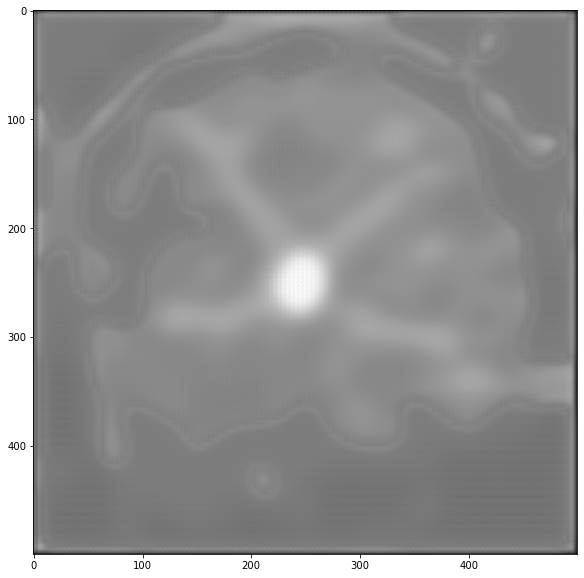

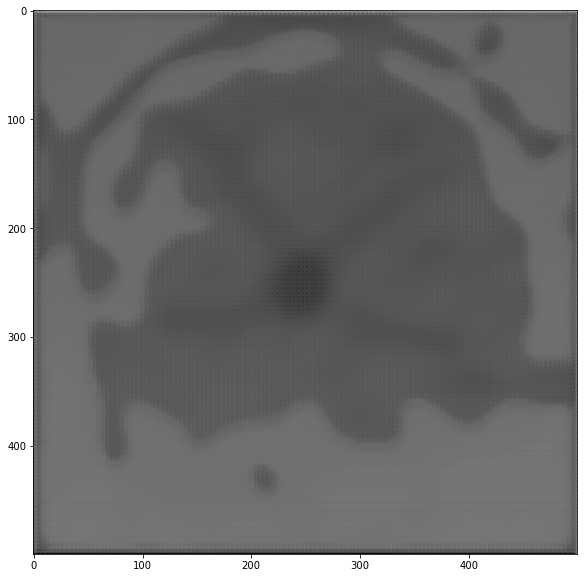

epoch [200/2500]     Loss: 0.009343731402459686


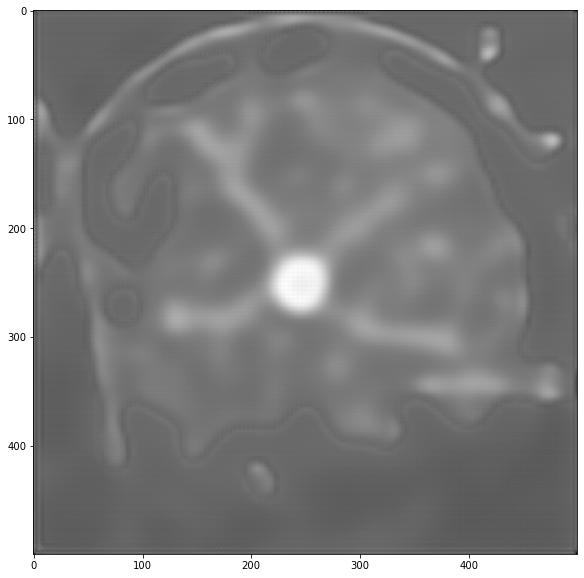

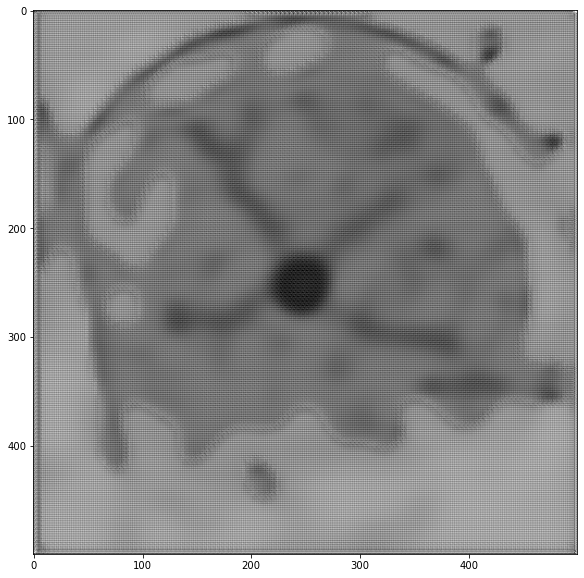

epoch [300/2500]     Loss: 0.007374970898902378


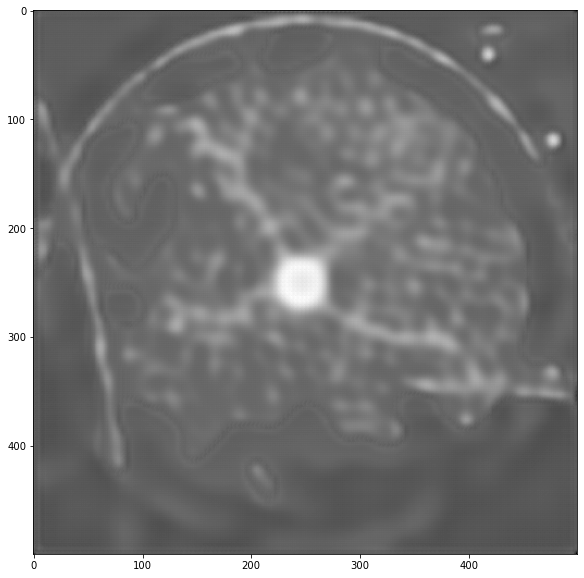

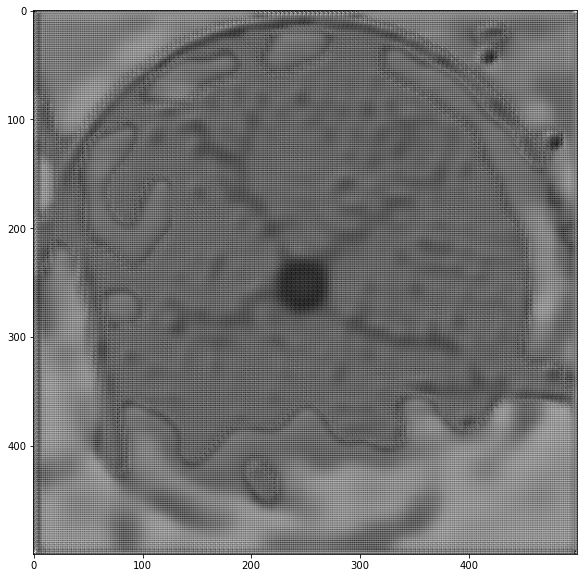

epoch [400/2500]     Loss: 0.006956214049667352


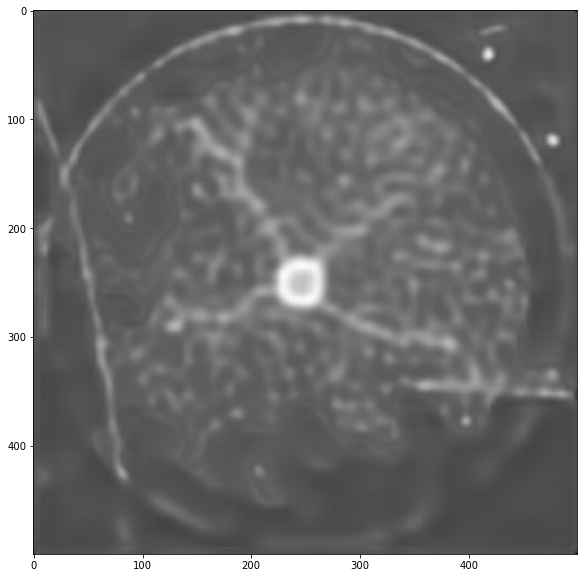

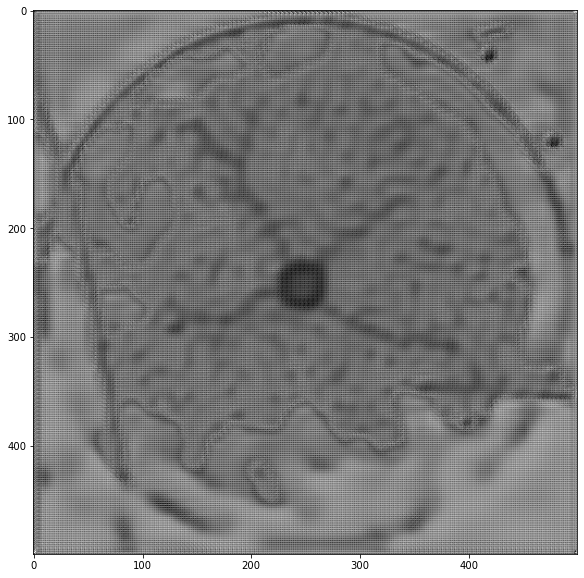

epoch [500/2500]     Loss: 0.006121724256621908


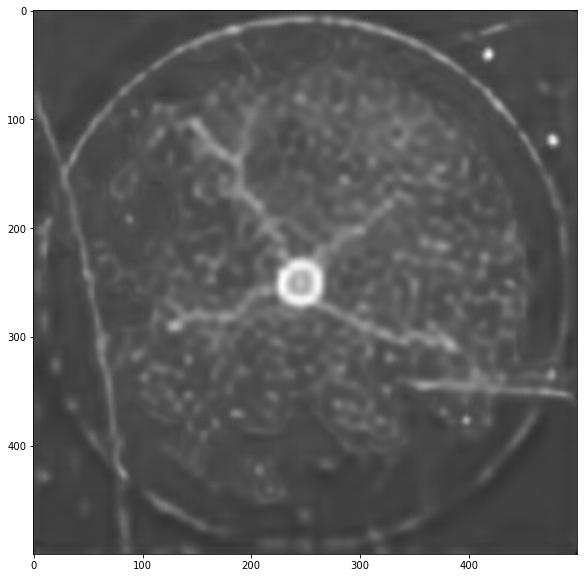

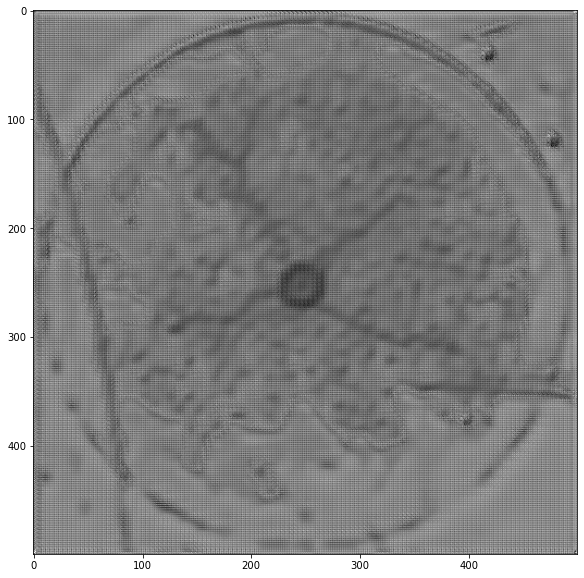

epoch [600/2500]     Loss: 0.005372698395163309


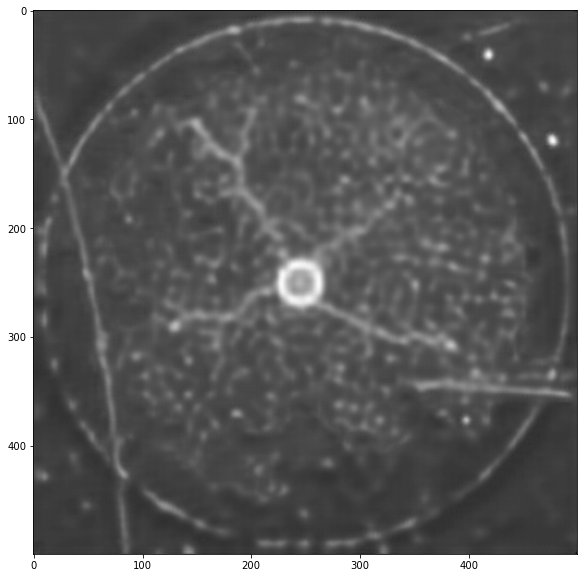

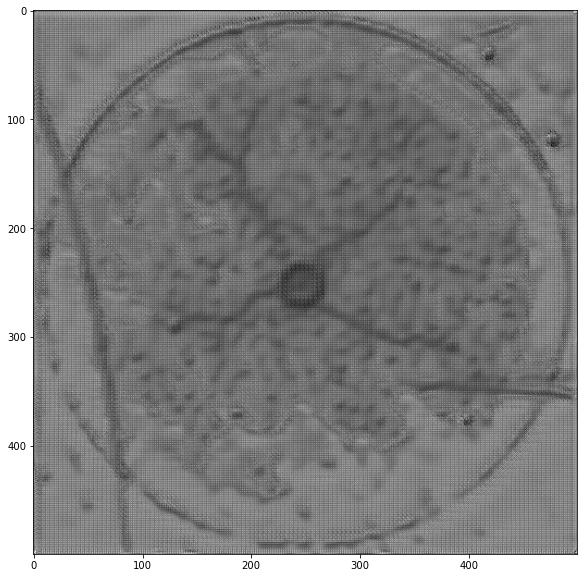

epoch [700/2500]     Loss: 0.004907169142367513


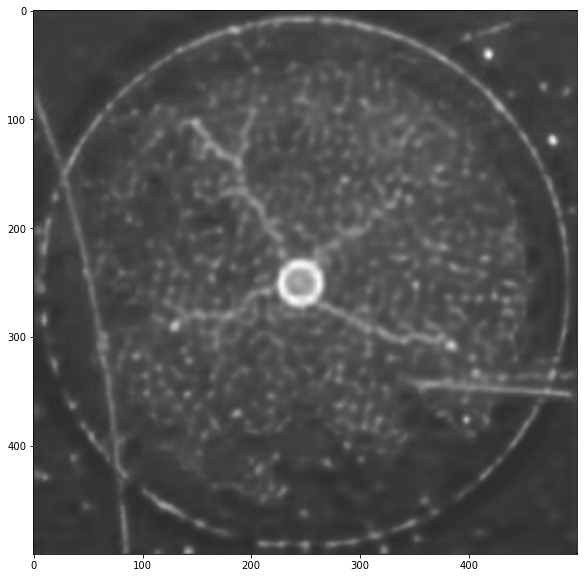

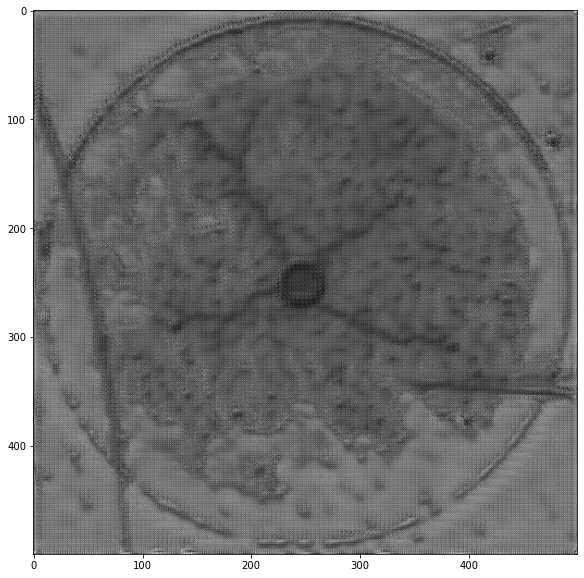

epoch [800/2500]     Loss: 0.004753814743447751


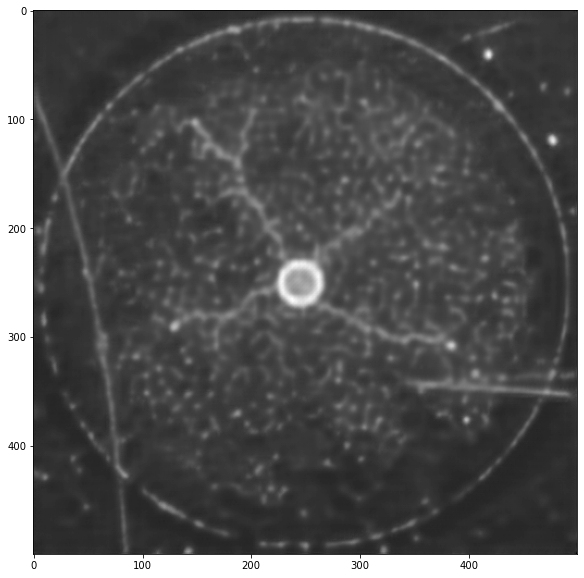

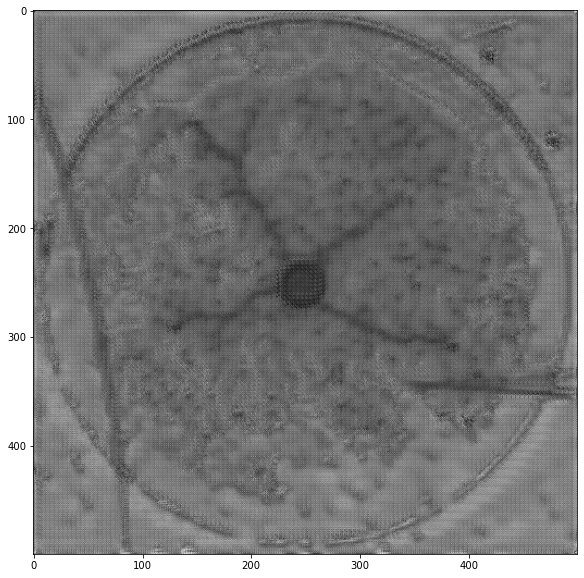

epoch [900/2500]     Loss: 0.004270196632384839


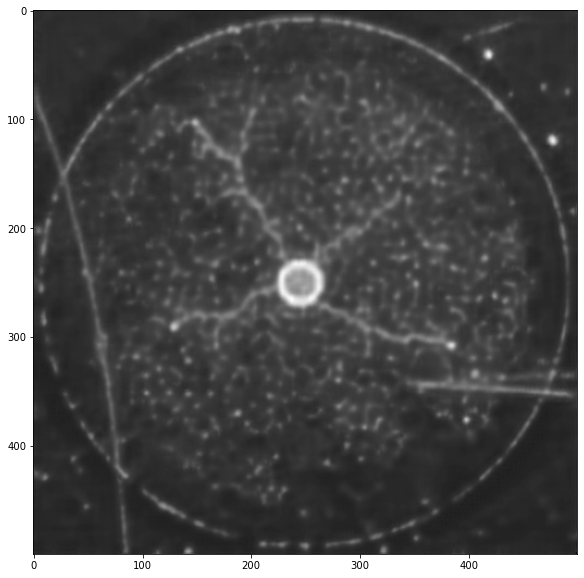

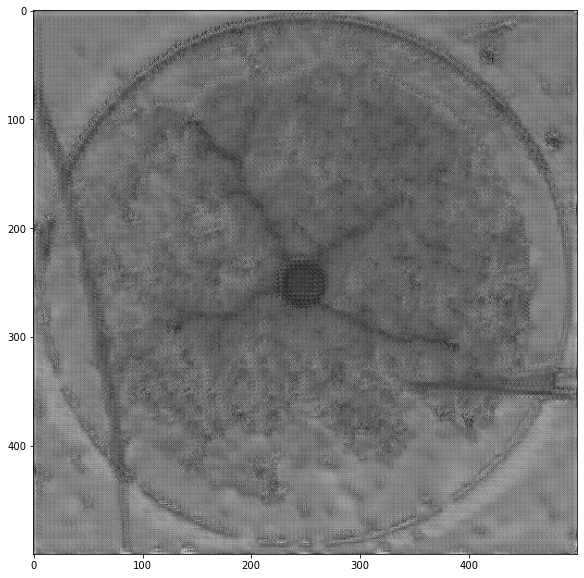

epoch [1000/2500]     Loss: 0.004011202045895944


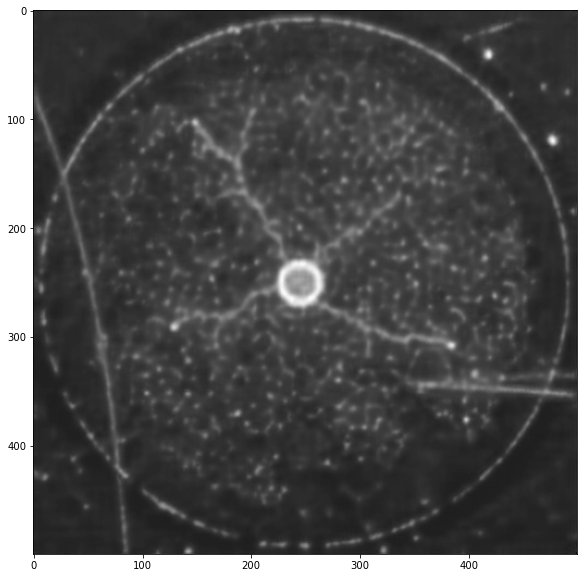

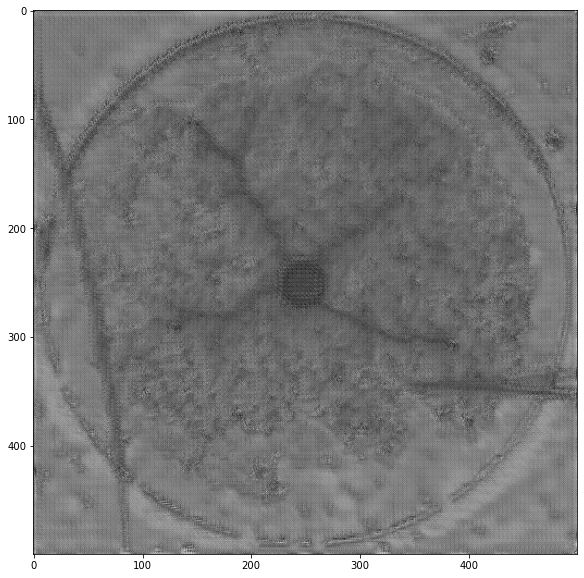

epoch [1100/2500]     Loss: 0.003899734994746154


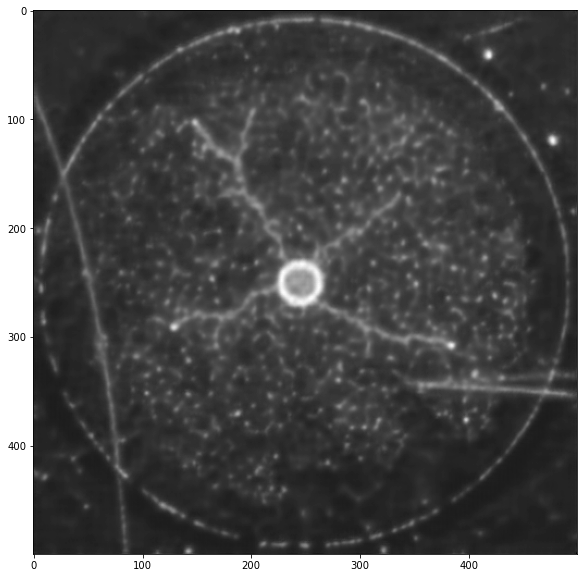

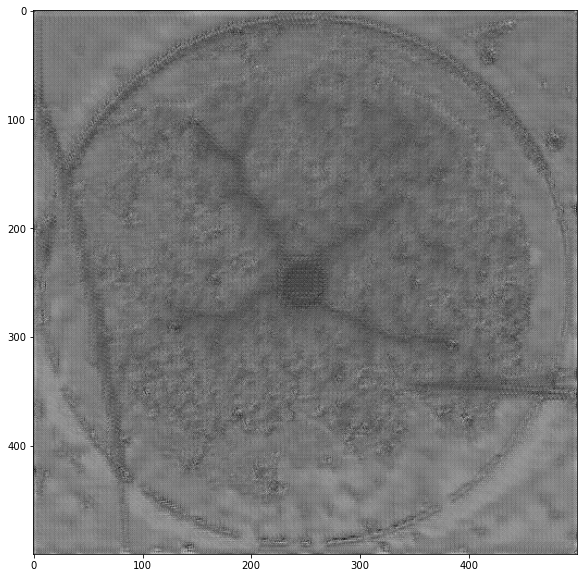

epoch [1200/2500]     Loss: 0.0039379196241245175


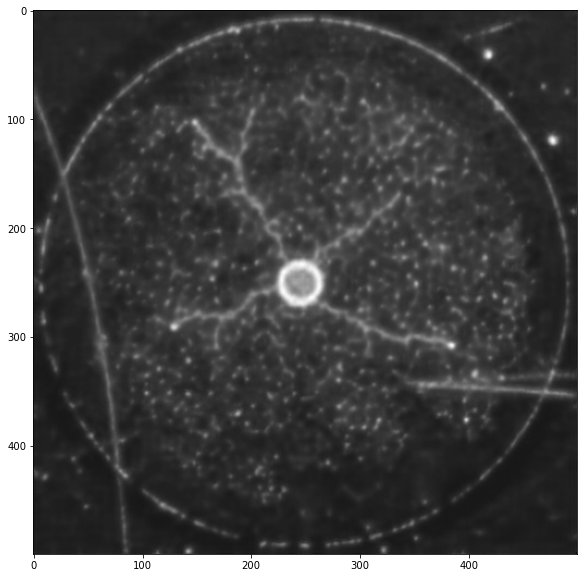

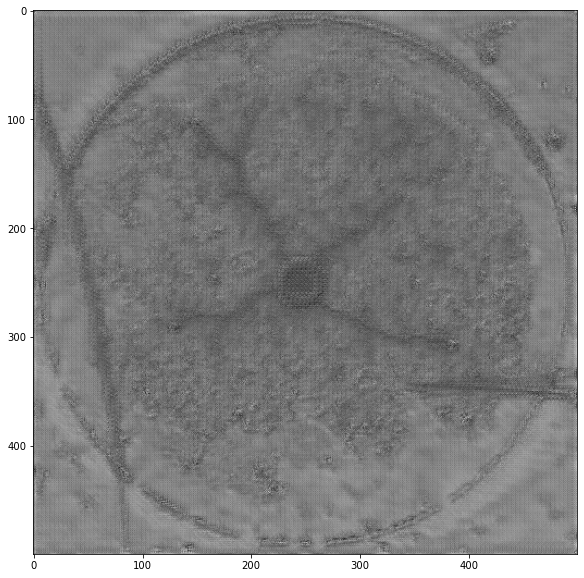

epoch [1300/2500]     Loss: 0.0036328322971517332


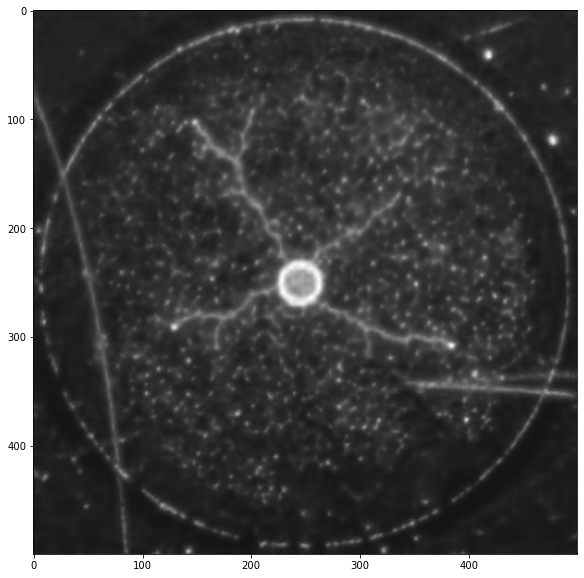

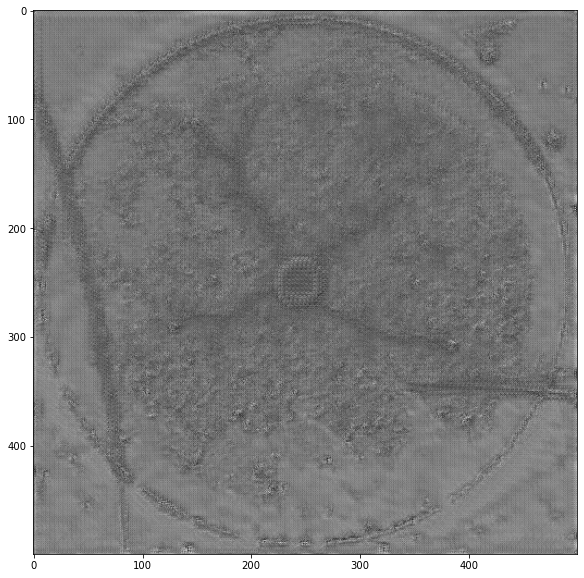

epoch [1400/2500]     Loss: 0.0032501206818699746


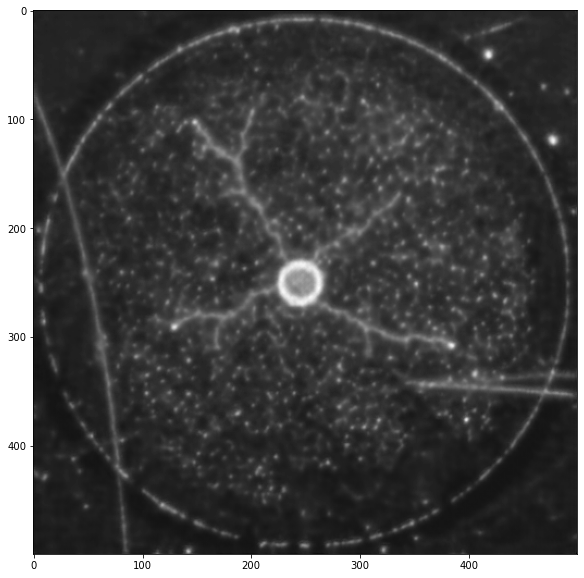

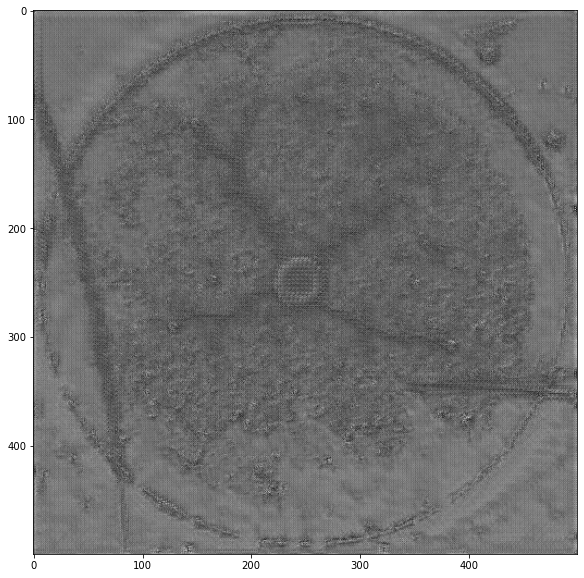

epoch [1500/2500]     Loss: 0.0032302385850421383


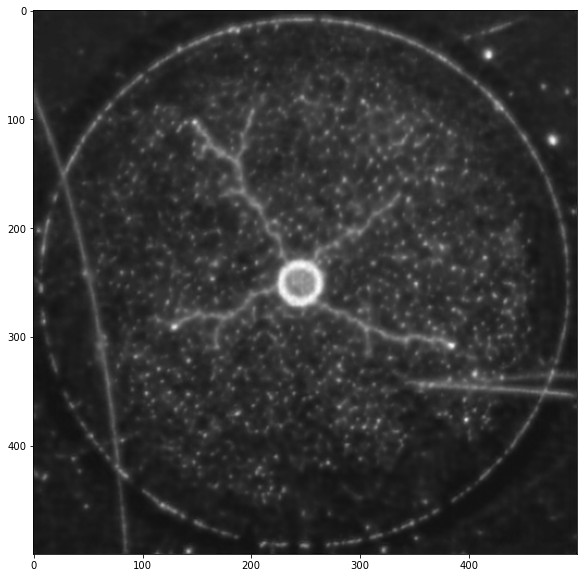

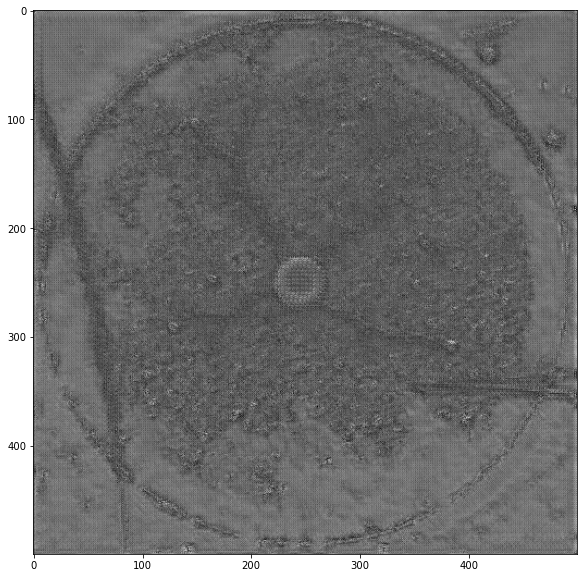

epoch [1600/2500]     Loss: 0.0032239574864153637


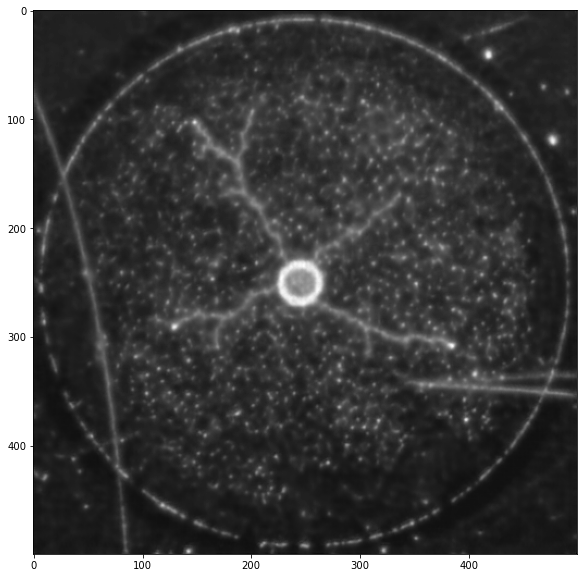

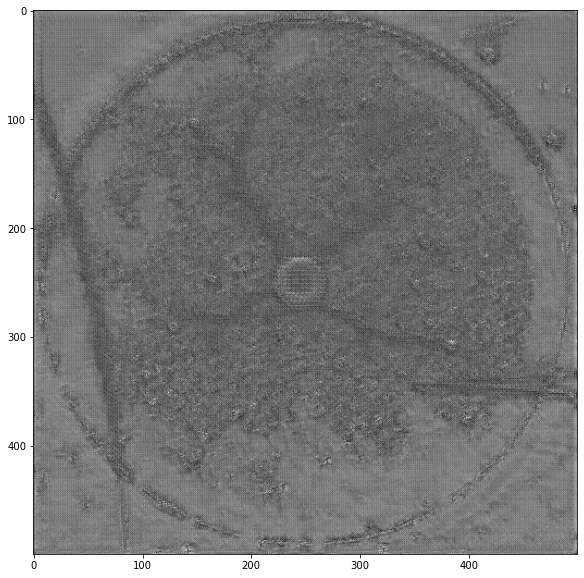

epoch [1700/2500]     Loss: 0.002796877427185646


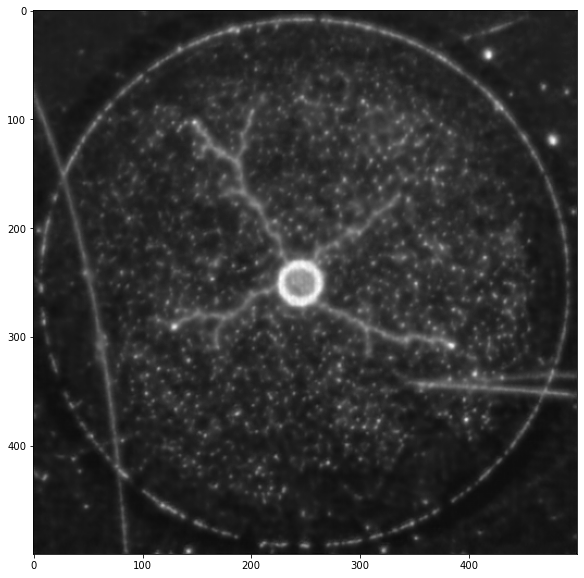

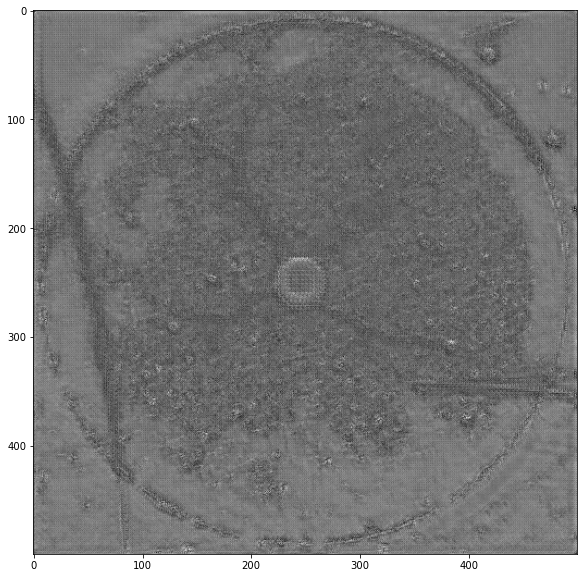

epoch [1800/2500]     Loss: 0.0026643258357329424


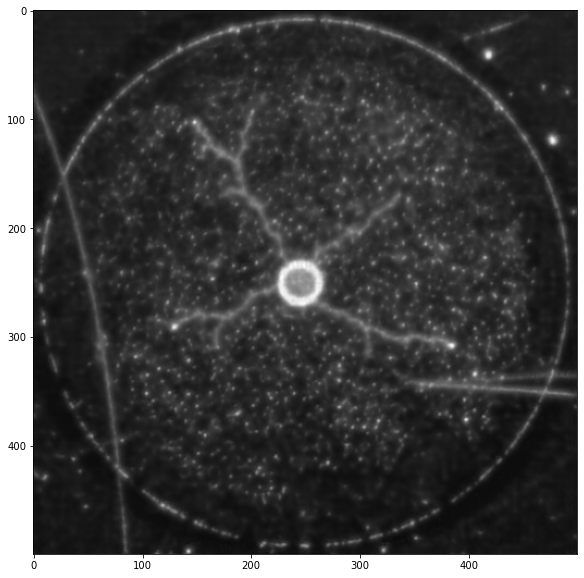

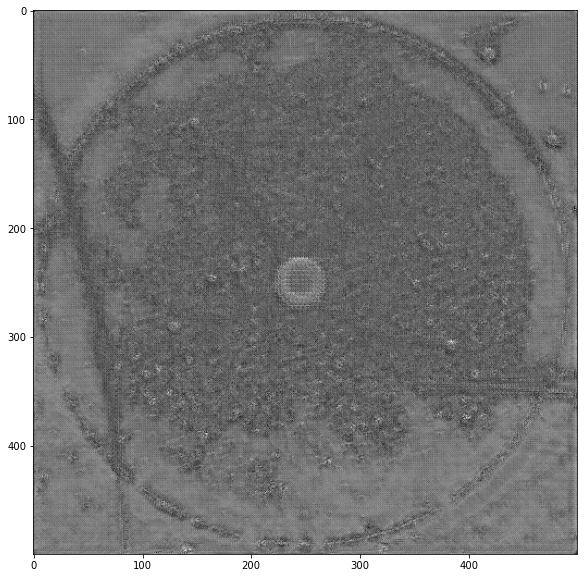

epoch [1900/2500]     Loss: 0.0024715309847992612


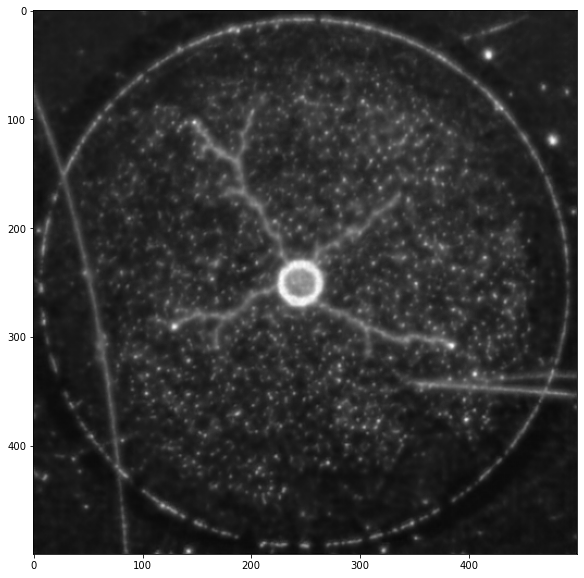

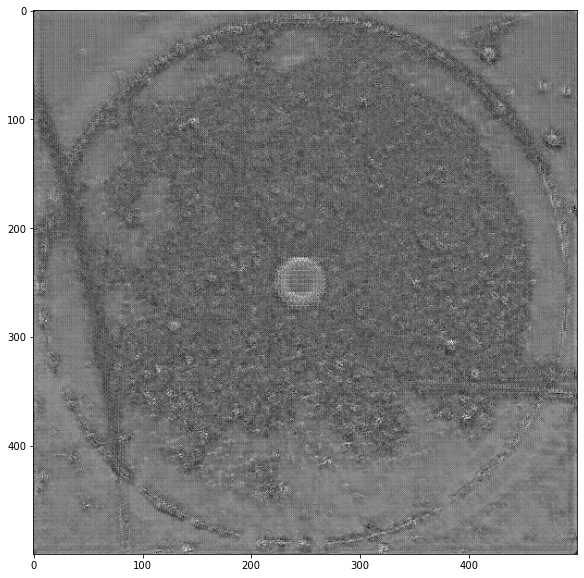

epoch [2000/2500]     Loss: 0.0023316346294582945


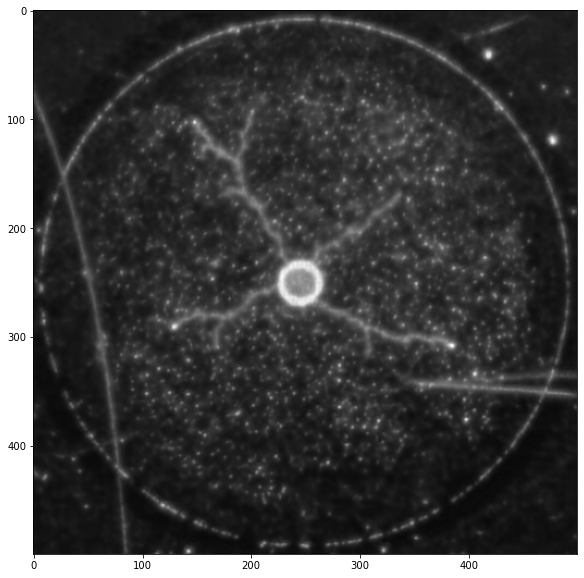

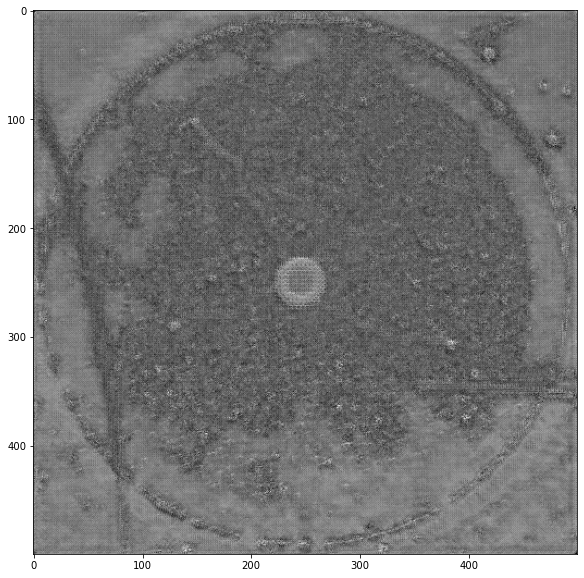

epoch [2100/2500]     Loss: 0.002221142338898395


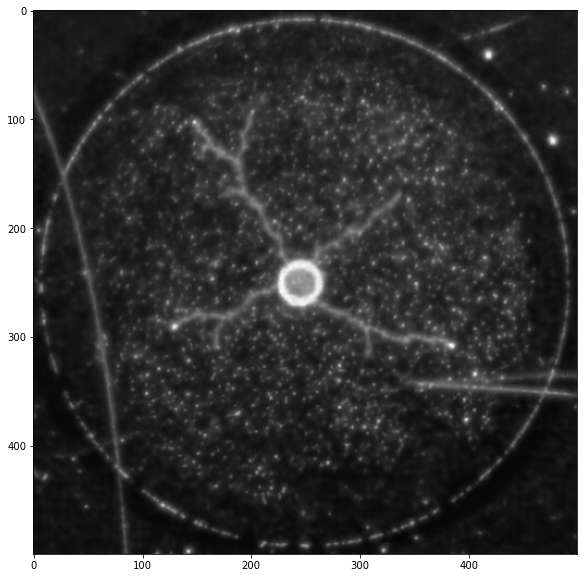

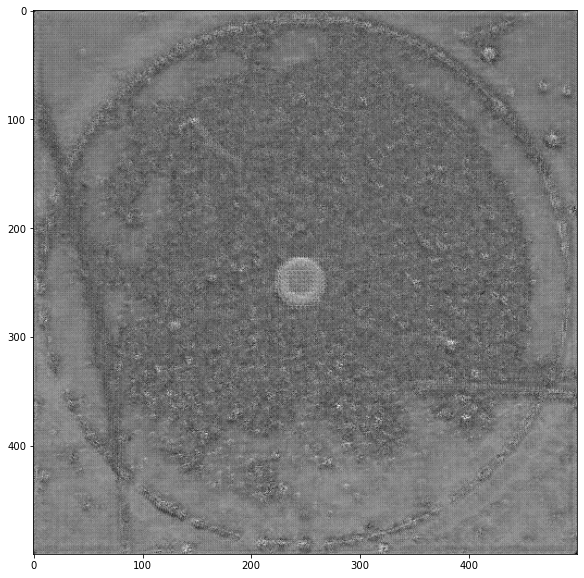

epoch [2200/2500]     Loss: 0.002338279481666682


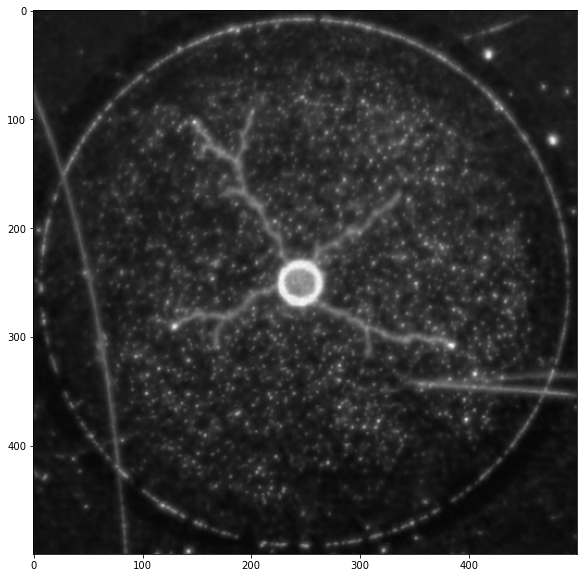

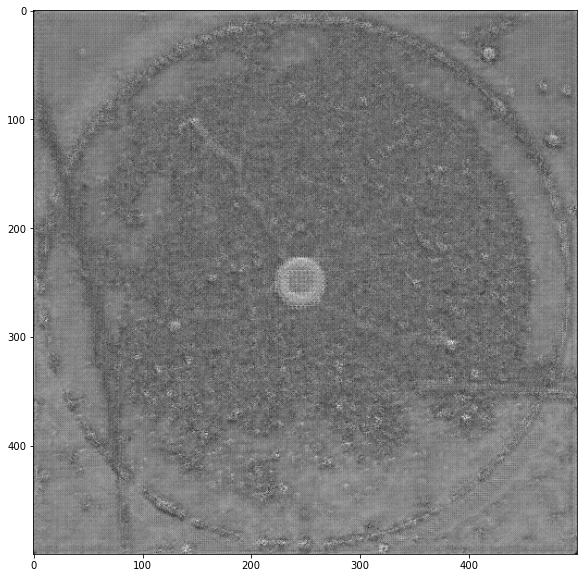

epoch [2300/2500]     Loss: 0.0019901316675071585


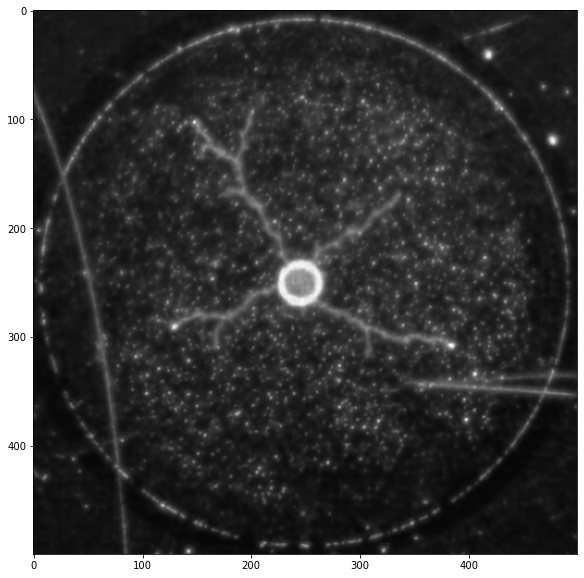

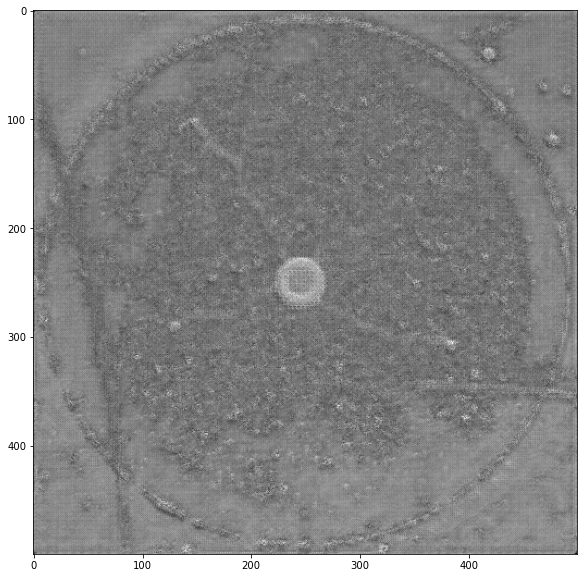

epoch [2400/2500]     Loss: 0.0019630436792593504


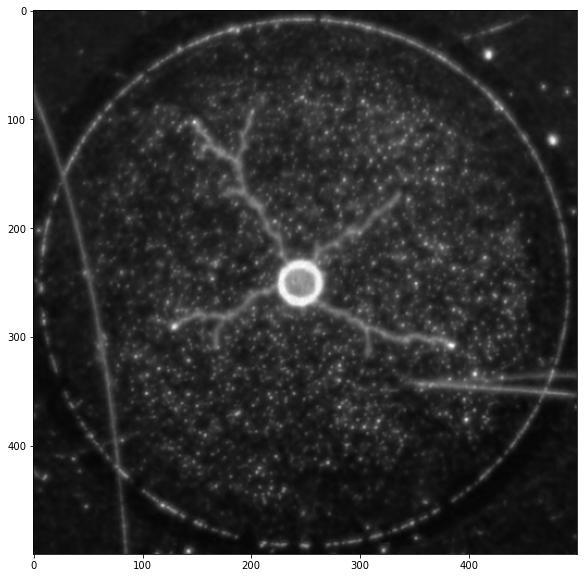

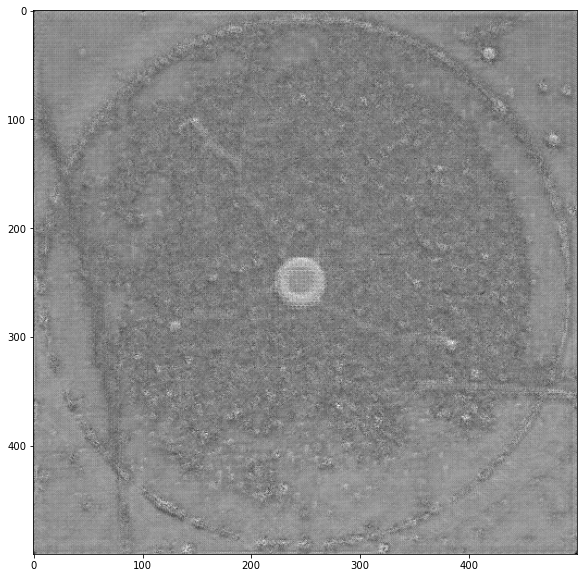

epoch [2500/2500]     Loss: 0.002074506301347679


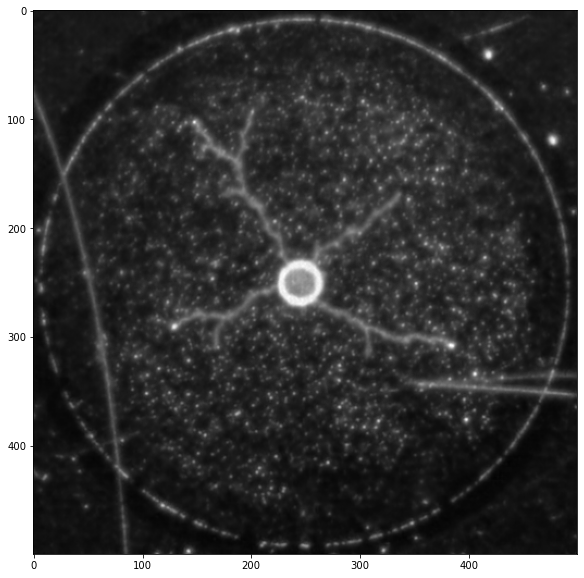

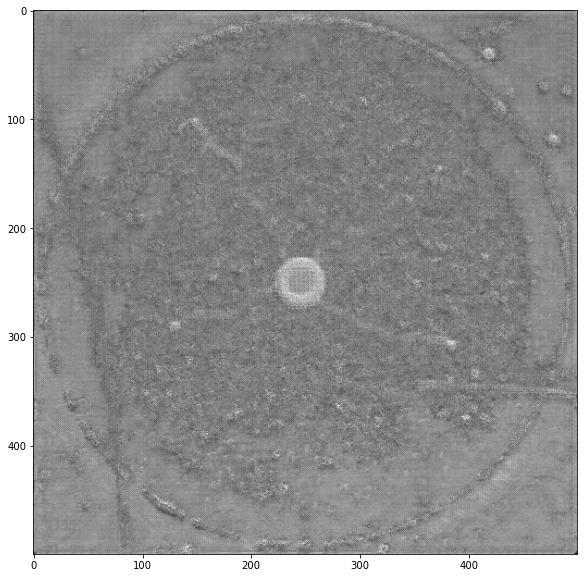

In [15]:
pil2tensor = transforms.ToTensor()
tensor2pil = transforms.ToPILImage()


for i in range(epoch):
    optimizer.zero_grad()
    out = model(eta) 
    loss = criterion(out, holo) 
    loss.backward()
    optimizer.step()
    
    #print('epoch [{}/{}]     Loss: {}'.format(i+1, epoch, loss.cpu().data.numpy()))
    if ((i+1) % period) == 0:
        print('epoch [{}/{}]     Loss: {}'.format(i+1, epoch, loss.cpu().data.numpy()))
        outtemp = out.cpu().data.squeeze(0)
        outtemp = outtemp
        plotout = torch.sqrt(outtemp[0,:,:]**2 + outtemp[1,:,:]**2)
        plotout = (plotout - torch.min(plotout))/(torch.max(plotout)-torch.min(plotout))
        plt.figure(figsize=(10,10))
        plt.imshow(tensor2pil(plotout), cmap='gray')
        plt.show()
        
        plotout_p = outtemp.numpy()
        plotout_p = np.arctan2(plotout_p[0,:,:], plotout_p[1,:,:])
        plotout_p = Phase_unwrapping(plotout_p)
        plotout_p = (plotout_p - np.min(plotout_p))/(np.max(plotout_p)-np.min(plotout_p))
        
        plt.figure(figsize=(10,10))
        plt.imshow((plotout_p), cmap='gray')
        plt.show()
        
        


In [16]:
img_save = tensor2pil(plotout)
img_save = np.array(img_save)/255.
imsave('./rec.bmp',np.squeeze(img_save))
imsave('./gray.bmp',np.squeeze(img))
imsave('./holo.bmp',np.squeeze(hologram))
imsave('./bp.bmp',np.squeeze(np.abs(bp)))


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.21552765252903908, 1.216713101176662]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


interm = interm.cpu().data.squeeze(0)
interm = interm

for i in range(32):
    plotout = interm[i,:,:]
    #plotout = (plotout - torch.min(plotout))/(torch.max(plotout)-torch.min(plotout))
    plt.figure(figsize=(15,15))
    plt.imshow(tensor2pil(plotout), cmap='gray')
    plt.show()

import skimage
outtemp = out.cpu().data.squeeze(0)
outtemp = outtemp
plotout = torch.sqrt(outtemp[0,:,:]**2 + outtemp[1,:,:]**2)
plotout = (plotout - torch.min(plotout))/(torch.max(plotout)-torch.min(plotout))
plt.figure(figsize=(15,15))
plt.imshow(tensor2pil(plotout), cmap='gray')
plt.show()

img_save = tensor2pil(plotout)
img_save = np.array(img_save)/255.
skimage.io.imsave('./L6_abs_rec.bmp',img_save)